<a href="https://colab.research.google.com/github/Yash-Mawalkar/Bear_Classifier/blob/main/Bear_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Bear Classifier**

All the necessary imports to be done : 


In [ ]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 719 kB 2.1 MB/s 
     |████████████████████████████████| 431 kB 44.1 MB/s 
     |████████████████████████████████| 4.9 MB 53.1 MB/s 
     |████████████████████████████████| 1.3 MB 59.0 MB/s 
     |████████████████████████████████| 212 kB 57.9 MB/s 
     |████████████████████████████████| 120 kB 65.4 MB/s 
     |████████████████████████████████| 115 kB 67.1 MB/s 
     |████████████████████████████████| 127 kB 65.4 MB/s 
     |████████████████████████████████| 6.6 MB 7.9 MB/s 
Mounted at /content/gdrive


In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

We need some database in order to carry out our classifier, so here we chose the Duck Duck Go browser to search for some images to fill out our database.


In [ ]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

We have set up the browser in which we need to search, now we have to input the keyword of the images we need to extract from ddg....
these are grizzly bear
and then we just display the number of images we could arrange in our database.

In [ ]:
results = search_images_ddg( 'grizzly bear')
ims = results.attrgot('contentUrl')
len(ims)

200

Therefore, We've successfully downloaded the URLs of 200 grizzly bears (or, at least, images that ddg Image Search finds for that search term).

NB: there's no way to be sure exactly what images a search like this will find. The results can change over time. We've heard of at least one case of a community member who found some unpleasant pictures of dead bears in their search results. You'll receive whatever images are found by the web search engine. If you're running this at work, or with kids, etc, then be cautious before you display the downloaded images.

Let's look at one of the image we downloaded to confirm our precise search:


In [ ]:
#hide
ims = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']

need to save the image as a variable to display it in a fastai format


In [ ]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

Let's set our image to display by adjusting its size to 128 by 128 pixels

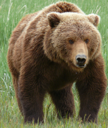

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

This seems to have worked nicely, so let's use fastai's download_images to download all the URLs for each of our search terms. We'll put each in a separate folder:

In [ ]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [ ]:
# if not path.exists():
#     path.mkdir()
#     for o in bear_types:
#         dest = (path/o)
#         dest.mkdir(exist_ok=True)
#         results = search_images_ddg( 'bear')
#         download_images(dest, urls=results.attrgot('contentUrl'))
from time import sleep
for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_ddg('bear')
    download_images(dest, urls=results)
    # download_images(dest, urls=search_images_ddg('bear'))
    # sleep(10)  # Pause between searches to avoid over-loading server
    # download_images(dest, urls=search_images_ddg('black bear'))
    # sleep(10)
    # download_images(dest, urls=search_images_ddg('teddy bear'))
    # sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Our folder has image files, as we'd expect:

In [ ]:
fns = get_image_files(path)
fns

(#579) [Path('bears/black/509f8ff6-123f-4275-9c72-d3815e27b80a.jpg'),Path('bears/black/1bff58a5-3625-49fc-bf80-65dc0b5588be.jpg'),Path('bears/black/f36d11dd-f11a-4a18-aa98-e50a1c9b3e61.jpg'),Path('bears/black/9f62d3c8-29e9-412a-b518-ba90184a2611.jpg'),Path('bears/black/ed235d05-cc00-4799-b293-4b4a641713ec.jpg'),Path('bears/black/75a0bb92-3b1b-4d9a-a9a5-44c81a7d8454.jpg'),Path('bears/black/201ae503-32e7-4561-a77f-8b403fea499c.jpg'),Path('bears/black/ff6d1da3-6939-431e-9940-050ae67ad23f.jpg'),Path('bears/black/5ac5ec38-ea7f-4ce0-a080-ba4e19330b4c.jpg'),Path('bears/black/7e9402b9-a5b6-4d5f-bb70-dbeab4276b08.jpg')...]

Often when we download files from the internet, there are a few that are corrupt. Let's check:

In [ ]:
failed = verify_images(fns)
failed

(#4) [Path('bears/black/dff9e911-a00e-4970-a3d1-fed01ba5ab3b.jpg'),Path('bears/black/8f5c432f-25fb-4c45-ac84-96c407b5f1d2.jpg'),Path('bears/grizzly/06438f57-02f9-4124-b66e-b0df697e2134.jpg'),Path('bears/teddy/65a79d76-ef2b-4a49-ae60-bc92bedd2ae3.jpg')]

In [ ]:
failed.map(Path.unlink);

In [ ]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

This command has given us a DataBlock object. This is like a template for creating a DataLoaders. We still need to tell fastai the actual source of our data—in this case, the path where the images can be found:

In [ ]:
dls = bears.dataloaders(path)

A DataLoaders includes validation and training DataLoaders. DataLoader is a class that provides batches of a few items at a time to the GPU. We'll be learning a lot more about this class in the next chapter. When you loop through a DataLoader fastai will give you 64 (by default) items at a time, all stacked up into a single tensor. We can take a look at a few of those items by calling the show_batch method on a DataLoader:

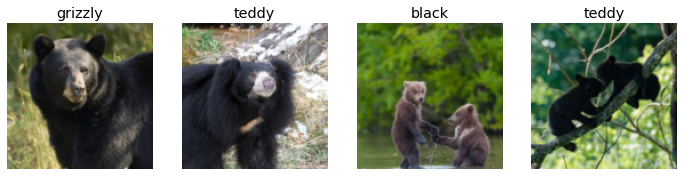

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

By default Resize crops the images to fit a square shape of the size requested, using the full width or height. This can result in losing some important details. Alternatively, you can ask fastai to pad the images with zeros (black), or squish/stretch them:

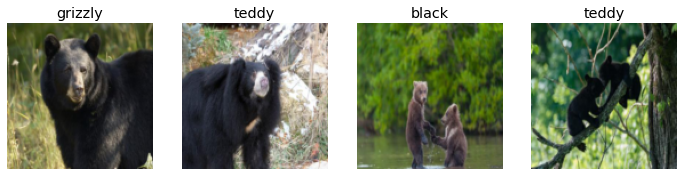

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

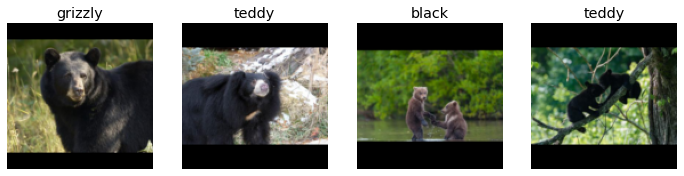

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

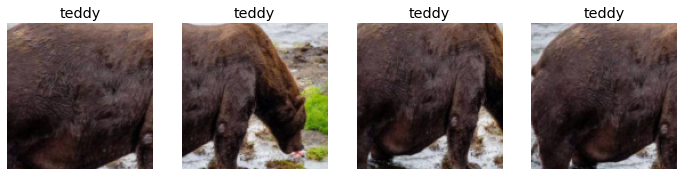

In [ ]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

We used unique=True to have the same image repeated with different versions of this RandomResizedCrop transform. This is a specific example of a more general technique, called data augmentation.

**Data Augmentation**

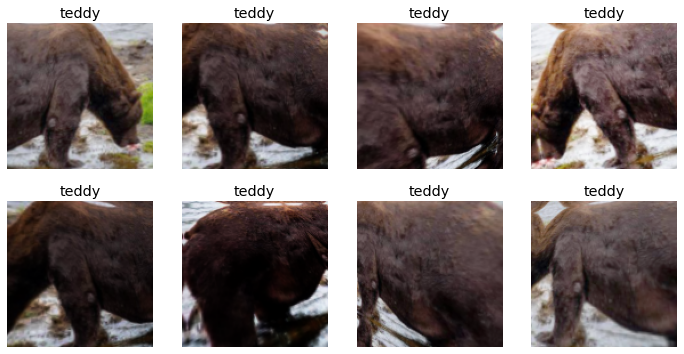

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

**Training Your Model, and Using It to Clean Your Data**

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

We can now create our Learner and fine-tune it in the usual way:

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(1)


epoch,train_loss,valid_loss,error_rate,time
0,1.920822,1.695612,0.678261,01:26


epoch,train_loss,valid_loss,error_rate,time
0,1.869251,1.684641,0.704348,02:06


Now let's see whether the mistakes the model is making are mainly thinking that grizzlies are teddies (that would be bad for safety!), or that grizzlies are black bears, or something else. To visualize this, we can create a confusion matrix:

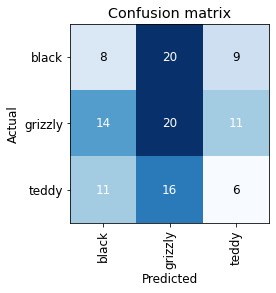

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The rows represent all the black, grizzly, and teddy bears in our dataset, respectively. The columns represent the images which the model predicted as black, grizzly, and teddy bears, respectively. Therefore, the diagonal of the matrix shows the images which were classified correctly, and the off-diagonal cells represent those which were classified incorrectly. This is one of the many ways that fastai allows you to view the results of your model. It is (of course!) calculated using the validation set. With the color-coding, the goal is to have white everywhere except the diagonal, where we want dark blue. Our bear classifier isn't making many mistakes!

It's helpful to see where exactly our errors are occurring, to see whether they're due to a dataset problem (e.g., images that aren't bears at all, or are labeled incorrectly, etc.), or a model problem (perhaps it isn't handling images taken with unusual lighting, or from a different angle, etc.). To do this, we can sort our images by their loss.

The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer. In a couple of chapters we'll learn in depth how loss is calculated and used in the training process. For now, plot_top_losses shows us the images with the highest loss in our dataset. As the title of the output says, each image is labeled with four things: prediction, actual (target label), loss, and probability. The probability here is the confidence level, from zero to one, that the model has assigned to its prediction:

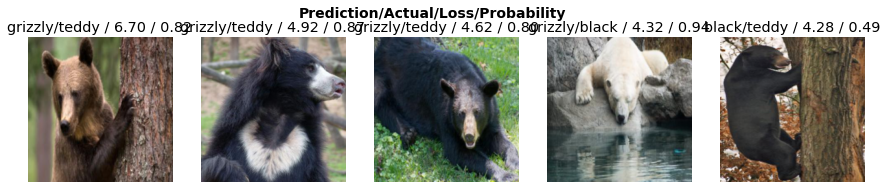

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner